# Assignment 3: Motion AutoEncoder

In this assignment, you will implement and train an autoencoder for motion generation using the CMU-Mocap dataset. You will develop a simplified version of a motion manifold system capable of learning from motion capture data, synthesizing new movements, and enabling basic motion editing techniques.

Please read the following two papers as they are your reference for your implementation:
* Learning Motion Manifolds with Convolutional Autoencoders, https://www.ipab.inf.ed.ac.uk/cgvu/motioncnn.pdf
* A Deep Learning Framework for Character Motion Synthesis and Editing, https://www.ipab.inf.ed.ac.uk/cgvu/motionsynthesis.pdf

To help you understand motion data representation, here are some valuable resources:

* **CMU Mocap dataset**: https://mocap.cs.cmu.edu/
  * The raw data format may be challenging to interpret directly. For easier use, download the BVH format (which our dataloader utilizes): https://github.com/una-dinosauria/cmu-mocap
  * Blender (https://www.blender.org/) can be used to visualize the downloaded BVH files. This will provide a clearer understanding of the human skeleton structure used in the dataset and allow you to visualize the raw motion sequences.
* **Additional reference** (optional): For a deeper exploration of human models, you can examine more motion data in FBX format at: https://www.mixamo.com/#/?page=1&type=Motion%2CMotionPack
  * Note that Mixamo uses a different skeletal structure than our dataset, but it includes human mesh deformation with motion, which BVH data doesn't provide.


This assignment includes substantial starter code in separate Python files to help you get started. Your tasks are to:

* Complete all sections marked with `TODO` comments. Feel free to add code or restructure functions to improve your implementation's flexibility during training.
* Present your results by embedding videos and images in this notebook. You should also answer all questions and complete the write-up sections in this notebook.
* Include all necessary video files, images, and code files in your submission for proper evaluation. **Important**: Do NOT submit model checkpoints as these will unnecessarily increase your submission size.

**Please reserve enough time for this assignment given the potential amount of time for training.**

In [6]:
# For you to add video to your submission.
from IPython.display import Video

## Part 1: Familiarize Yourself with the Data (10 pt)

Unlike previous assignments where standard dataloaders were readily available in existing libraries, this assignment requires implementing a custom dataloader for the CMU-Mocap dataset.

We've provided most of the dataloader implementation in `dataloader.py` and included a pre-processed version of the necessary data in `cmu-mocap/cache` (https://utexas.box.com/s/3krvxej37se14puhi7biwget1v7amp9u). Please download this data and place the `cmu-mocap` folder in your current working directory. Alternatively, you can download the BVH files from the links provided earlier and generate your own pre-processed data.

For this part, you need to implement data normalization in the dataloader. There are two sets of TODOs in the file:

1. First, compute appropriate statistics for normalizing your data based on the entire dataset
2. Second, implement the normalization procedure in the `__getitem__` function where the dataloader retrieves one batch of data

Upon successful completion of this section, you should be able to visualize four sample motion sequences by running `python dataloader.py`.

Important notes:
* There are multiple approaches to normalizing motion data. You are free to choose any method that produces reasonable training results in the subsequent sections.
* Include visualizations of your **normalized motion** sequences in your submission for this part, following the example format below.

In [73]:
# Replace with your own video file.
Video('output/normalizations/sample_2_normalized.mp4', embed=True)

## Part 2: Motion Manifold Learning (45 points)

In this section, you will implement the neural network architecture and training methodology described in the reference paper to learn a motion manifold.

### Convolutional Autoencoder Architecture (15 points)

1. Implement the convolutional autoencoder following the architecture detailed in (one of) the reference paper in `MotionAutoencoder`.
2. Develop both the encoding and decoding operations that will allow the network to compress motion data into a lower-dimensional manifold representation and then reconstruct it.

### Training Procedure (30 points)

1. Implement the training procedure in `MotionManifoldTrainer` for your autoencoder, carefully considering the appropriate loss function(s) to use for motion data.
2. Generate and include training curves using the visualization template provided in the starter code.

Important considerations:
1. The reference paper was published several years ago when neural network implementations were often manually coded with custom operations. You'll need to adapt these concepts to modern PyTorch conventions and standard operations. Some training parameters may require adjustment to work effectively with contemporary deep learning frameworks.
2. Your submission for this part should include clear visualizations of your training curves showing loss change over time.

In [44]:
import importlib
import AE
import dataloader
importlib.reload(AE)
import torch
from visualization import visualize_motion_to_video
data_dir = "./cmu-mocap"
output_dir = "./output/motion_manifold" 
import os

# print(torch.cuda.is_available())
# print(torch.cuda.device_count())
# print(torch.cuda.get_device_name(0))

In [45]:
# if torch.backends.mps.is_available():
#     device = "mps"
# elif torch.backends.cuda.is_available():
#     device = "cuda"

device = "mps"

# print(f"Using device: {device}")

trainer = AE.MotionManifoldTrainer(
    data_dir=data_dir,
    output_dir=output_dir,
    device=device,
    learning_rate=0.001,
    fine_tune_lr=0.0001 
)


Using device: mps
Found 0 BVH files in ./cmu-mocap
Loading preprocessed data from cache: ./cmu-mocap/cache/dataset_fr30_ws160_ol0.5_vel1_fc1.pkl
Loaded 9839 windows
Dataset loaded with 9839 windows from 2480 files
Training samples: 8856, Validation samples: 983
Input includes positions (114 dims) and velocities (3 dims!!!)
Created model with input dimension: 117


In [5]:
import json

# training_stats = trainer.train()

stats_path = 'output/motion_manifold/training_stats.json'
with open(stats_path, "r") as f:
    stats = json.load(f)
 
trainer._plot_training_curves(stats)

Training curves saved to ./output/motion_manifold/plots/training_curves.png


![Training Curves](output/motion_manifold/plots/training_curves.png)

## Part 3: Motion Synthesis (30 points)

### Motion Interpolation (15 points)

Implement the function `MotionManifoldSynthesizer.interpolate_motions` that creates transitions between different motions using the learned manifold. This function should accept two motion sequences sampled from the dataset and generate an interpolated motion that blends naturally between them. You can visualize your results using the provided `visualize_interpolation` function.

Your submission for this section should include at least two video examples demonstrating motion interpolation between different movement types.

In [14]:
# sample motion sequence
data_dir = "./cmu-mocap/"
output_dir = "./output/motion_interpolation"
model_path = "./output/motion_manifold/models/motion_autoencoder.pt"
os.makedirs(output_dir, exist_ok=True)

dataset = dataloader.CMUMotionDataset(
    data_dir=data_dir,
    frame_rate=30,
    window_size=160,
    overlap=0.5
)

synthesizer = AE.MotionManifoldSynthesizer(model_path=model_path, device=device, dataset=dataset)


Found 0 BVH files in ./cmu-mocap/
Loading preprocessed data from cache: ./cmu-mocap/cache/dataset_fr30_ws160_ol0.5_vel1_fc1.pkl
Loaded 9839 windows
Using device: mps
Inferred input dimension 117 from model weights
Model loaded from ./output/motion_manifold/models/motion_autoencoder.pt


/Users/akaman150/UT Classes/Generative visual computing (CS378)/Assignment 3/AE.py:449: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_state = torch.load(model_path, ma

In [34]:
from visualization import visualize_interpolation
first_motion = 2390
second_motion = 4003

motion1 = dataset[first_motion]
motion2 = dataset[second_motion]

positions1 = motion1["positions_normalized_flat"].unsqueeze(0).to(device)                          
positions2 = motion2["positions_normalized_flat"].unsqueeze(0).to(device)
trans_vel1 = motion1["trans_vel_normalized"].unsqueeze(0).to(device)              
trans_vel2 = motion2["trans_vel_normalized"].unsqueeze(0).to(device)
rot_vel1 = motion1["rot_vel_normalized"].unsqueeze(0).to(device)                   
rot_vel2 = motion2["rot_vel_normalized"].unsqueeze(0).to(device)

t = 0.5
interpolated_positions = synthesizer.interpolate_motions(
    positions1, trans_vel1, rot_vel1,
    positions2, trans_vel2, rot_vel2,
    t
)

# Get only the reconstructed positions (not normalized, already recovered)
interpolated = interpolated_positions["positions"]  # shape: [1, T, J, 3]

# Prepare source motions for comparison
motion1_local = motion1["positions"].unsqueeze(0).to(device)
motion2_local = motion2["positions"].unsqueeze(0).to(device)

# visualize the interpolated motion
output_file = os.path.join(output_dir, f"{first_motion}-{second_motion}_interpolated_motion.mp4")
visualize_interpolation(motion1_local, motion2_local, interpolated, dataset.joint_parents, output_file)



Interpolation animation saved to ./output/motion_interpolation/2390-4003_interpolated_motion.mp4


'./output/motion_interpolation/2390-4003_interpolated_motion.mp4'

In [ ]:
# interpolation of motion 1000 and 1001
Video('output/motion_interpolation/1000-1001_interpolated_motion.mp4', embed=True)

In [ ]:
# interpolation of motion 2390 and 4003
Video('output/motion_interpolation/2390-4003_interpolated_motion.mp4', embed=True)

### Fixing Corrupt Motion Data (15 points)

Implement the function `MotionManifoldSynthesizer.fix_corrupted_motion` that projects corrupted motion data onto the learned manifold and reconstructs corrected, natural-looking movements. This function should demonstrate the manifold's ability to act as a prior distribution over valid human motion. Use the provided `visualize_motion_comparison` function to create side-by-side comparisons of the corrupted input and your reconstructed output.

Your submission for this section should include at least two video examples showing motion correction from different types of corruptions provided in the starter code.

In [ ]:
from visualization import visualize_motion_comparison
import AE
importlib.reload(AE)

sample_idx = 3002 
motion = dataset[sample_idx]

output_dir = "./output/corrupted_motion"
os.makedirs(output_dir, exist_ok=True)


# Add batch dim for synthesizer
motion_batch = {
    'positions': motion['positions'].unsqueeze(0),
    'trans_vel_xz': motion['trans_vel_xz'].unsqueeze(0),
    'rot_vel_y': motion['rot_vel_y'].unsqueeze(0)
}

# Apply corruption and fix
corruption_type = 'missing'  
corruption_params = {'joint_idx': 9}  

# corruption_type = 'noise'
# corruption_params = {'scale': 0.1}

# corruption_type = 'zero'
# corruption_params = {'prob': 0.5}  

corrupted, fixed = synthesizer.fix_corrupted_motion(
    motion_batch,
    corruption_type=corruption_type,
    corruption_params=corruption_params
)

# Save the visualization
output_file = os.path.join(output_dir, f"sample_{sample_idx}_{corruption_type}_fix.mp4")
visualize_motion_comparison(
    original_tensor=corrupted, 
    fixed_tensor=fixed, 
    joint_parents=dataset.joint_parents,
    output_path=output_file
)

print(f"Saved corrupted vs fixed comparison to {output_file}")


Fixed motion shape: torch.Size([1, 160, 38, 3])
Comparison animation saved to ./output/corrupted_motion/sample_3002_missing_fix.mp4
Saved corrupted vs fixed comparison to ./output/corrupted_motion/sample_3002_missing_fix.mp4


In [49]:
# fixing missing joint corruption
Video('output/corrupted_motion/sample_3002_missing_fix.mp4', embed=True)

In [52]:
# fixing noise corruption
Video('output/corrupted_motion/sample_3002_noise_fix.mp4', embed=True)

In [51]:
# fixing zero corruption
Video('output/corrupted_motion/sample_3002_zero_fix.mp4', embed=True)

### Visualize Latent Space with PCA

100%|██████████| 500/500 [00:01<00:00, 387.03it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


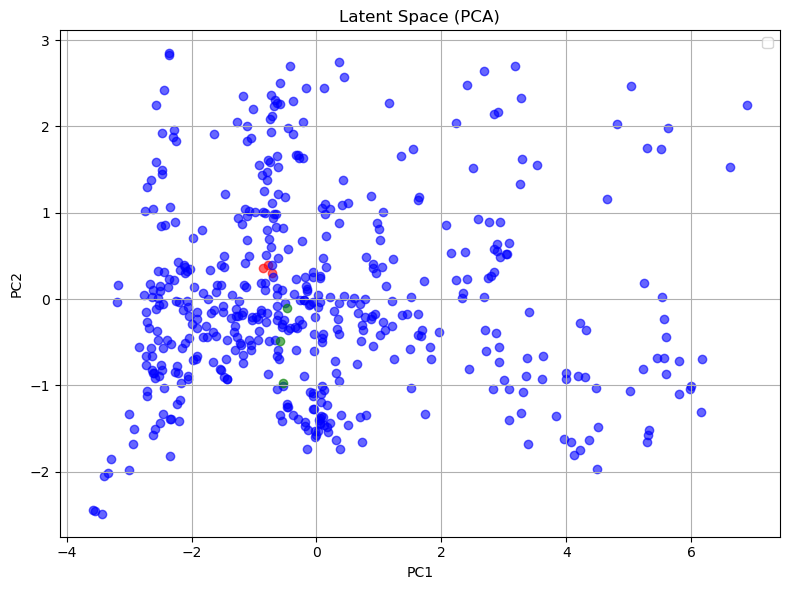

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from tqdm import tqdm

# visualizing the moanifold
num_samples = 500

# Collect latent representations and labels (if available)
latent_vectors = []

# Disable gradients for inference
synthesizer.model.eval()
with torch.no_grad():
    for i in tqdm(range(num_samples)):
        sample = dataset[i]

        # Prepare normalized input
        positions = sample["positions_normalized_flat"].unsqueeze(0).to(synthesizer.device)
        trans_vel = sample["trans_vel_normalized"].unsqueeze(0).to(synthesizer.device)
        rot_vel = sample["rot_vel_normalized"].unsqueeze(0).unsqueeze(-1).to(synthesizer.device)

        x = torch.cat([positions, trans_vel, rot_vel], dim=-1).permute(0, 2, 1)  # [1, channels, time]

        # Encode into latent space
        latent = synthesizer.model.encode(x)  
        pooled = latent.mean(dim=2)
        latent_vectors.append(pooled.squeeze(0).cpu().numpy())

# Convert to array
latent_array = np.stack(latent_vectors)

colors = ['red'] * 3 + ['blue'] * (num_samples - 6) + ['green'] * 3

# Apply PCA
pca = PCA(n_components=2)
latent_2d = pca.fit_transform(latent_array)

# Plot
plt.figure(figsize=(8, 6))
for i in range(num_samples):
    plt.scatter(latent_2d[i, 0], latent_2d[i, 1], color=colors[i], alpha=0.6)
plt.title("Latent Space (PCA)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("latent_space_pca.png")
plt.show()

## Part 4. Analysis Questions (15 pt)

Answer the question with your analysis. The questions are open-ended. We are looking for you own observasion from the expriments you did. Autoencoder is known as a relatively simple method so a lot of things here won't be perfect.

1. Explain your chosen normalization approach for the motion data. Why did you select this method, and how does it specifically address the challenges of human motion data? What other normalization techniques did you consider, and why did you not choose them?

[Answer]: Normalized the joint's poisitions, the rotational velocities in the y axis, and the translational velocities in the x and z axis. I chose to normalize these features independently as opposed to together beacuse I believed that location based data and velocity based data are different enough that normalizaing them globally would remove some of their semantic importance in human movement. There is the other option of normalizing each joint to the mean and standard deviation of its own joint. While this would preserve even more information, I argued that human motion is limited enough that each joint has a limited amount of motion, and that restriction allows the joints to be normalized against all joint positions without losing too much information.

2. After training your autoencoder, explore and describe the structure of your learned manifold. You can use t-SNE or PCA to visualize the hidden unit space (include one image in your answer).  Are different motion types clustered in particular regions? Can you identify meaningful directions in the latent space that correspond to specific motion attributes (speed, posture, etc.)?

[Answer]: After plotting the manifold onto a 2D space using PCA I can see visible clusters that exist in the manifold. This means that there is a clear moapping that exists and it is not random. I then set the first three motions and last three motions to be poltted with the same color, red and green respecively. The red motions are all clustered almost exactly together whereas the green motions are all on the same x axis but at different y axis level. The red motions are all very cimilar jumping/hopping motions with minor changes in the last few frames, whereas the green motions are similar sweeping/mopping motions but the human rotates differently for these motions. This leads me to believe that the x axis plots posture while the y axis plots rotation along the xz plane.

![Training Curves](latent_space_pca.png)

3. Critically analyze the quality of your interpolated motions. Where does the interpolation succeed or fail? What patterns do you notice about transitions between dissimilar motions versus similar ones?

[Answer]: The interpolated motions are of decent quality, especially when the two motions are very similar. In the example of interpolating between motions 1000 and 1001 (the walking motions), the model performed very well. One thing that makes the inerpolated motion flawed is that it acts as an average of the two motions, this means that there isn't a perfect transition between the end of the first motion and the start of the second motion. This can be seen in the first video example where the interpolated motion copies half of the scond motions rotation at the end of the motion. When the inputs are very different motions such as in the second example, the model seems to do a good job at avergeing out the motions–although it would be preferable for the model to synthesize a motion that perfectly transitions and blends into both movements.

4. For the corrupted motion reconstruction task, analyze which types of corruption your system handles well versus poorly. What does this tell you about the properties of your learned manifold?

[Answer]: The model worked better at fixing corrupted data than it did at dealing with motion interpolation. When a specific joint was set to 0 it did a decent job at reconstructing the motion. When the missing joint was something more rigid like a hip it performed very well but whenit was something more dynamic like a knee it struggled to reconstuct the motion exacylt, although the reconstruction is still considered human-like motion. When half the joints where zeroed out, it struggled to recreate the motion. The posture and overall movements where correct but the arms were completely off. This makes sense since arms are the most dynamic body part and thus hardest to recreate. However, when noise was added to corrupt the model does an incredible job of recreating the motion despite the corrupted motion looking incomprehensible to a human. The vast difference between the noise corruption and zero corruption reconstruction must mean that the model struggles when a joint is zeroed out as opposed to its position being perturbed. Perhaps becuase the learned manifold doesn't have a lot of mappings with joints at 0 compared to other locations.

## Extra Credit: Advanced Motion Synthesis and Editing (20 points)

In this optional extra credit section, you'll implement more sophisticated motion synthesis techniques and potentially extend your model architecture to achieve these advanced tasks.

For this task, you'll develop a method to complete partially specified motion sequences. Given a motion with missing frames, your system should intelligently fill in the gaps while maintaining natural movement characteristics and continuity.

You need:
- Develop a method to mask out and fill missing segments in motion sequences
- Ensure smooth transitions between existing and synthesized motion
- Leverage your trained motion manifold to generate plausible completions

Your submission shoud:
- Provide at least two examples of filling gaps in the middle of motion sequences
- Provide at least two examples of extending incomplete motions by synthesizing the ending frames
- For each visualization, you need to show the input and output side-by-side
- Include a short analysis of your approach and the quality of your results

### Motion Edtiting (10 points)

For this task, you'll implement the style transfer technique described in "A Deep Learning Framework for Character Motion Synthesis and Editing." This will allow you to transfer the style characteristics of one motion to another while preserving the content of the target motion.

You need to develop the method to add constraint on the trained autoencoder.

Your submission shoud:
- Provide at least three examples of motion editing results between different motion types. Each visualization should include the original content motion, the reference motion, and your result
- Write a short analysis of your results, discussing successes, limitations, and potential improvements


In [66]:
from visualization import visualize_motion_comparison

sample = 2312
motion = dataset[sample]

output_dir = "./output/advanced_synthesis"
os.makedirs(output_dir, exist_ok=True)

synthesizer = AE.MotionManifoldSynthesizer(model_path=model_path, device=device, dataset=dataset)

# Add batch dim for synthesizer
motion_batch = {
    'positions': motion['positions'].unsqueeze(0),
    'positions_normalized_flat': motion['positions_normalized_flat'].unsqueeze(0),
    'trans_vel_normalized': motion['trans_vel_normalized'].unsqueeze(0),
    'rot_vel_normalized': motion['rot_vel_normalized'].unsqueeze(0)
}

# Middle completion example
filled = synthesizer.advanced_motion_synthesis(
    motion_batch,
    gap_type='middle',
    gap_params={'start': 60, 'end': 100, 'length': 60}
)
visualize_motion_comparison(motion['positions'], filled, dataset.joint_parents, f"./output/{sample}_middle_gap_completion.mp4")

# End extrapolation example
extended = synthesizer.advanced_motion_synthesis(
    motion_batch,
    gap_type='end',
    gap_params={'start': 70, 'end': 90, 'length': 90}
)
# pad og motion to match the extended motion
motion['positions'] = torch.cat([motion['positions'], torch.zeros(90, 38, 3)], dim=0)
# visualize_motion_to_video(extended, dataset.joint_parents, f"./output/{sample}_end_extrapolation.mp4")
visualize_motion_comparison(motion['positions'], extended, dataset.joint_parents, f"./output/{sample}_end_extrapolation.mp4")

Using device: mps
Inferred input dimension 117 from model weights
Model loaded from ./output/motion_manifold/models/motion_autoencoder.pt


/Users/akaman150/UT Classes/Generative visual computing (CS378)/Assignment 3/AE.py:449: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_state = torch.load(model_path, ma

Comparison animation saved to ./output/2312_middle_gap_completion.mp4
Comparison animation saved to ./output/2312_end_extrapolation.mp4


'./output/2312_end_extrapolation.mp4'

### Filling in motion gaps

In [71]:
# filling in motion gaps
Video('output/advanced_synthesis/50_middle_gap_completion.mp4', embed=True)

In [70]:
Video('output/advanced_synthesis/2312_middle_gap_completion.mp4', embed=True)

### Extending motions

In [69]:
Video('output/advanced_synthesis/50_end_extrapolation.mp4', embed=True)

In [ ]:
Video('output/advanced_synthesis/2312_middle_gap_completion.mp4', embed=True)

Analysis of advance motion synthesis:

Filling in missing frames:
To complete missing frames in the middle of a motion, I masked a segment of the input sequence and passed it through the autoencoder. The model attempts to fill it in smoothly. this is similar to handling zeroed out joint noise but more difficult since its reconstructing the entire the body;s entire motion instead of a a single or handful of joints. However, since the gap in the sequence was only 2 seconds long (60 frames), the model does an adequate job of recreating the general motion. HOwever, the transition between the original motion and the filled in motion is stil choppy and the difference is even more apparent during fast moving motions such as the second example. Perhaps an additional smoothing function could be added to blend the motions.


Extending Motions:
To extend a motion, I passed the full input sequence into the autoencoder and extracted additional frames from the tail of the reconstructed output. These appended frames represent a plausible continuation, leveraging the model’s understanding of motion patterns without any conditioning on future context. The output is stylisticly consistent but it is limited but it is limited only working well for short extensions.